### Install Dependencies

In [1]:
!pip install optuna swifter

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.2/1.2 MB 5.1 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... - \ done
  Created wheel for swifter: filename=swifter-1.4.0-py3-none-any.whl size=16506 sha256=f0fb2f653ad6c1d503349df3db9568950204fd5bb7fa3efe9376799b8a729c76
  Stored in directory: /root/.cache/pip/wheels/e4/cf/51/0904952972ee2c7aa3709437065278dc534ec1b8d2ad41b443
Successfully built swifter


### Load All Libraries

In [2]:
import os
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
import optuna
from sklearn.model_selection import learning_curve
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score, recall_score, classification_report
from gensim.models import Word2Vec
from sklearn.metrics.pairwise import cosine_similarity
import swifter
import re
from sklearn.model_selection import cross_val_score
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.naive_bayes import MultinomialNB
from sklearn.model_selection import RandomizedSearchCV
from scipy.stats import uniform
import random
import string
from wordcloud import WordCloud

/opt/conda/lib/python3.10/site-packages/dask/dataframe/_pyarrow_compat.py:23: UserWarning: You are using pyarrow version 11.0.0 which is known to be insecure. See https://www.cve.org/CVERecord?id=CVE-2023-47248 for further details. Please upgrade to pyarrow>=14.0.1 or install pyarrow-hotfix to patch your current version.
  warnings.warn(
2024-02-27 00:15:42,853	INFO util.py:124 -- Outdated packages:
  ipywidgets==7.7.1 found, needs ipywidgets>=8
Run `pip install -U ipywidgets`, then restart the notebook server for rich notebook output.


In [3]:
books_path = '/kaggle/input/book-recommendation-dataset/Books.csv'
ratings_path = '/kaggle/input/book-recommendation-dataset/Ratings.csv'
users_path = '/kaggle/input/book-recommendation-dataset/Users.csv'

## EDA

In [4]:
books_df = pd.read_csv(books_path)

print("Books DataFrame:")
books_df.head()

Books DataFrame:


/tmp/ipykernel_26/268975234.py:1: DtypeWarning: Columns (3) have mixed types. Specify dtype option on import or set low_memory=False.
  books_df = pd.read_csv(books_path)


,ISBN,Book-Title,Book-Author,Year-Of-Publication,Publisher,Image-URL-S,Image-URL-M,Image-URL-L
0,0195153448,Classical Mythology,Mark P. O. Morford,2002,Oxford University Press,http://images.amazon.com/images/P/0195153448.0...,http://images.amazon.com/images/P/0195153448.0...,http://images.amazon.com/images/P/0195153448.0...
1,0002005018,Clara Callan,Richard Bruce Wright,2001,HarperFlamingo Canada,http://images.amazon.com/images/P/0002005018.0...,http://images.amazon.com/images/P/0002005018.0...,http://images.amazon.com/images/P/0002005018.0...
2,0060973129,Decision in Normandy,Carlo D'Este,1991,HarperPerennial,http://images.amazon.com/images/P/0060973129.0...,http://images.amazon.com/images/P/0060973129.0...,http://images.amazon.com/images/P/0060973129.0...
3,0374157065,Flu: The Story of the Great Influenza Pandemic...,Gina Bari Kolata,1999,Farrar Straus Giroux,http://images.amazon.com/images/P/0374157065.0...,http://images.amazon.com/images/P/0374157065.0...,http://images.amazon.com/images/P/0374157065.0...
4,0393045218,The Mummies of Urumchi,E. J. W. Barber,1999,W. W. Norton &amp; Company,http://images.amazon.com/images/P/0393045218.0...,http://images.amazon.com/images/P/0393045218.0...,http://images.amazon.com/images/P/0393045218.0...


In [5]:
ratings_df = pd.read_csv(ratings_path)

print("Ratings DataFrame:")
ratings_df.head()

Ratings DataFrame:


,User-ID,ISBN,Book-Rating
0,276725,034545104X,0
1,276726,0155061224,5
2,276727,0446520802,0
3,276729,052165615X,3
4,276729,0521795028,6


In [6]:
users_df = pd.read_csv(users_path)

print("Users DataFrame:")
users_df.head()

Users DataFrame:


,User-ID,Location,Age
0,1,"nyc, new york, usa",NaN
1,2,"stockton, california, usa",18.0
2,3,"moscow, yukon territory, russia",NaN
3,4,"porto, v.n.gaia, portugal",17.0
4,5,"farnborough, hants, united kingdom",NaN


Merger Data

In [7]:
merged_df = pd.merge(books_df, ratings_df, on='ISBN')

final_df = pd.merge(merged_df, users_df, on='User-ID')

# Print the combined dataframe
final_df.head()

,ISBN,Book-Title,Book-Author,Year-Of-Publication,Publisher,Image-URL-S,Image-URL-M,Image-URL-L,User-ID,Book-Rating,Location,Age
0,0195153448,Classical Mythology,Mark P. O. Morford,2002,Oxford University Press,http://images.amazon.com/images/P/0195153448.0...,http://images.amazon.com/images/P/0195153448.0...,http://images.amazon.com/images/P/0195153448.0...,2,0,"stockton, california, usa",18.0
1,0002005018,Clara Callan,Richard Bruce Wright,2001,HarperFlamingo Canada,http://images.amazon.com/images/P/0002005018.0...,http://images.amazon.com/images/P/0002005018.0...,http://images.amazon.com/images/P/0002005018.0...,8,5,"timmins, ontario, canada",NaN
2,0002005018,Clara Callan,Richard Bruce Wright,2001,HarperFlamingo Canada,http://images.amazon.com/images/P/0002005018.0...,http://images.amazon.com/images/P/0002005018.0...,http://images.amazon.com/images/P/0002005018.0...,11400,0,"ottawa, ontario, canada",49.0
3,0002005018,Clara Callan,Richard Bruce Wright,2001,HarperFlamingo Canada,http://images.amazon.com/images/P/0002005018.0...,http://images.amazon.com/images/P/0002005018.0...,http://images.amazon.com/images/P/0002005018.0...,11676,8,"n/a, n/a, n/a",NaN
4,0002005018,Clara Callan,Richard Bruce Wright,2001,HarperFlamingo Canada,http://images.amazon.com/images/P/0002005018.0...,http://images.amazon.com/images/P/0002005018.0...,http://images.amazon.com/images/P/0002005018.0...,41385,0,"sudbury, ontario, canada",NaN


In [8]:
final_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1031136 entries, 0 to 1031135
Data columns (total 12 columns):
 #   Column               Non-Null Count    Dtype  
---  ------               --------------    -----  
 0   ISBN                 1031136 non-null  object 
 1   Book-Title           1031136 non-null  object 
 2   Book-Author          1031134 non-null  object 
 3   Year-Of-Publication  1031136 non-null  object 
 4   Publisher            1031134 non-null  object 
 5   Image-URL-S          1031136 non-null  object 
 6   Image-URL-M          1031136 non-null  object 
 7   Image-URL-L          1031132 non-null  object 
 8   User-ID              1031136 non-null  int64  
 9   Book-Rating          1031136 non-null  int64  
 10  Location             1031136 non-null  object 
 11  Age                  753301 non-null   float64
dtypes: float64(1), int64(2), object(9)
memory usage: 94.4+ MB


In [9]:
final_df.shape

(1031136, 12)

## Visualize Data

By Author

/opt/conda/lib/python3.10/site-packages/IPython/core/pylabtools.py:152: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  fig.canvas.print_figure(bytes_io, **kw)


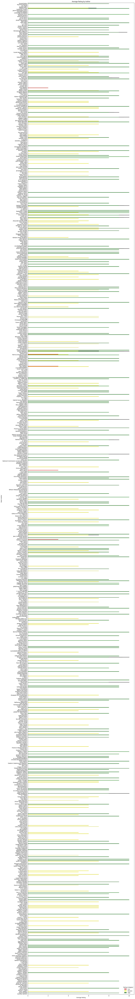

In [10]:
sample_size = 1000
sample_df = final_df.sample(n=sample_size, random_state=42)

# Variable rating
sample_df['Rating_Category'] = pd.cut(sample_df['Book-Rating'], bins=[0, 3, 7, 10], labels=['Low', 'Medium', 'High'])

# Barplot using seaborn
plt.figure(figsize=(16, 150))
sns.barplot(data=sample_df, x='Book-Rating', y='Book-Author', hue='Rating_Category', palette={'Low': 'red', 'Medium': 'yellow', 'High': 'green'})
plt.title('Average Rating by Author')
plt.xlabel('Average Rating')
plt.ylabel('Book Author')
plt.legend(title='Rating Category')
plt.show()

By Book Title

/opt/conda/lib/python3.10/site-packages/IPython/core/pylabtools.py:152: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  fig.canvas.print_figure(bytes_io, **kw)


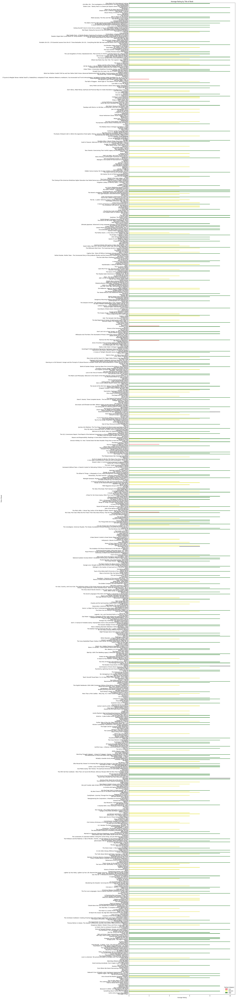

In [11]:
sample_size = 1000
sample_df = final_df.sample(n=sample_size, random_state=42)

# Variable rating
sample_df['Rating_Category'] = pd.cut(sample_df['Book-Rating'], bins=[0, 3, 7, 10], labels=['Low', 'Medium', 'High'])

# Plotting bar plot dengan seaborn
plt.figure(figsize=(16, 150))
sns.barplot(data=sample_df, x='Book-Rating', y='Book-Title', hue='Rating_Category', palette={'Low': 'red', 'Medium': 'yellow', 'High': 'green'})
plt.title('Average Rating by Title of Book')
plt.xlabel('Average Rating')
plt.ylabel('Title of Book')
plt.legend(title='Rating Category')
plt.show()

Growth of readers or book buyers from year to year

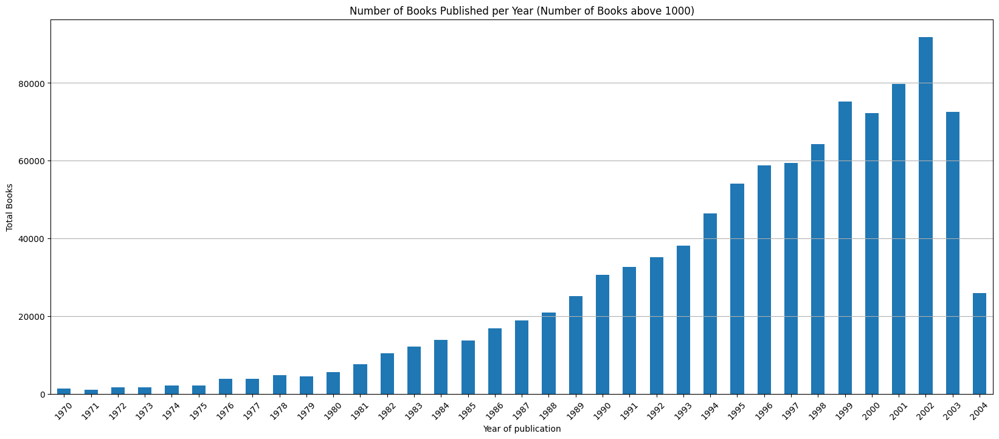

In [12]:
# Change NaN value to 0
final_df['Year-Of-Publication'] = pd.to_numeric(final_df['Year-Of-Publication'], errors='coerce').fillna(0)

# Set Data type of Year-Of-Publication to Integer
final_df['Year-Of-Publication'] = final_df['Year-Of-Publication'].astype(int)

# Filter valid publication years (greater than 0)
valid_years = final_df[final_df['Year-Of-Publication'] > 0]['Year-Of-Publication']

# Count total books per year
books_per_year_filtered = valid_years.value_counts()

# Filter the number of books published above 1000
books_per_year_filtered = books_per_year_filtered[books_per_year_filtered > 1000]

# Sort data based on year of publication from the previous year
books_per_year_filtered = books_per_year_filtered.sort_index(ascending=True)

# Bar plot
plt.figure(figsize=(20, 8))
books_per_year_filtered.plot(kind='bar')
plt.title('Number of Books Published per Year (Number of Books above 1000)')
plt.xlabel('Year of publication')
plt.ylabel('Total Books')
plt.xticks(rotation=45)
plt.grid(axis='y')
plt.show()

**Based on this graph, it can be concluded that in 2002 the most people read or bought books, and the year with the least was 1971**

## Data Preprocessing

In [13]:
columns = final_df.columns.tolist()
columns # 'Genre' column not available

['ISBN',
 'Book-Title',
 'Book-Author',
 'Year-Of-Publication',
 'Publisher',
 'Image-URL-S',
 'Image-URL-M',
 'Image-URL-L',
 'User-ID',
 'Book-Rating',
 'Location',
 'Age']

Check Missing Value

In [14]:
missing_values = final_df.isnull().sum()
missing_values

ISBN                        0
Book-Title                  0
Book-Author                 2
Year-Of-Publication         0
Publisher                   2
Image-URL-S                 0
Image-URL-M                 0
Image-URL-L                 4
User-ID                     0
Book-Rating                 0
Location                    0
Age                    277835
dtype: int64

Handling Missing Value

In [15]:
# Handle missing values in 'Book-Author' and 'Publisher' columns with mode
final_df['Book-Author'].fillna(final_df['Book-Author'].mode()[0], inplace=True)
final_df['Publisher'].fillna(final_df['Publisher'].mode()[0], inplace=True)

# Drop 'Image-URL-L' & 'Location' column if not needed
final_df.drop(columns=['Image-URL-L', 'Location'], inplace=True)

# Handle missing values in 'Age' column with median
final_df['Age'].fillna(final_df['Age'].median(), inplace=True)

In [16]:
missing_values = final_df.isnull().sum()
missing_values

ISBN                   0
Book-Title             0
Book-Author            0
Year-Of-Publication    0
Publisher              0
Image-URL-S            0
Image-URL-M            0
User-ID                0
Book-Rating            0
Age                    0
dtype: int64

In [17]:
# Change data type of numeric
final_df['Age'] = final_df['Age'].astype(int)
final_df['Book-Rating'] = final_df['Book-Rating'].astype(int)
final_df['User-ID'] = final_df['User-ID'].astype(int)

final_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1031136 entries, 0 to 1031135
Data columns (total 10 columns):
 #   Column               Non-Null Count    Dtype 
---  ------               --------------    ----- 
 0   ISBN                 1031136 non-null  object
 1   Book-Title           1031136 non-null  object
 2   Book-Author          1031136 non-null  object
 3   Year-Of-Publication  1031136 non-null  int64 
 4   Publisher            1031136 non-null  object
 5   Image-URL-S          1031136 non-null  object
 6   Image-URL-M          1031136 non-null  object
 7   User-ID              1031136 non-null  int64 
 8   Book-Rating          1031136 non-null  int64 
 9   Age                  1031136 non-null  int64 
dtypes: int64(4), object(6)
memory usage: 78.7+ MB


In [18]:
duplicate_count = final_df.duplicated().sum()
duplicate_count

0

Remove Book with Rating 0

In [19]:
final_df = final_df[final_df['Book-Rating'] != 0]

In [20]:
# Check book with rating 0
zero_rating_books_df = final_df[final_df['Book-Rating'] == 0]
zero_rating_books_df

,ISBN,Book-Title,Book-Author,Year-Of-Publication,Publisher,Image-URL-S,Image-URL-M,User-ID,Book-Rating,Age


/opt/conda/lib/python3.10/site-packages/IPython/core/pylabtools.py:152: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  fig.canvas.print_figure(bytes_io, **kw)


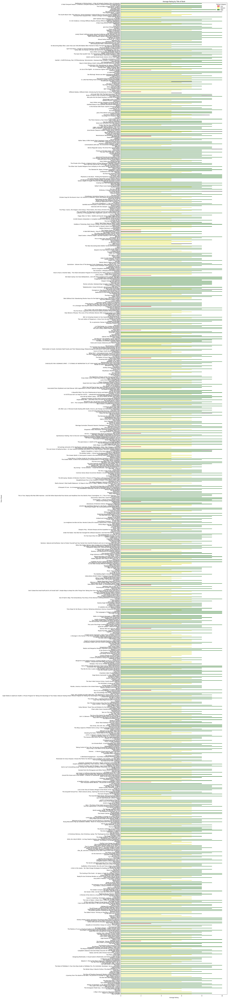

In [21]:
sample_size = 1000
sample_df = final_df.sample(n=sample_size, random_state=42)

# Variable rating
sample_df['Rating_Category'] = pd.cut(sample_df['Book-Rating'], bins=[0, 3, 7, 10], labels=['Low', 'Medium', 'High'])

# Plotting bar plot dengan seaborn
plt.figure(figsize=(16, 150))
sns.barplot(data=sample_df, x='Book-Rating', y='Book-Title', hue='Rating_Category', palette={'Low': 'red', 'Medium': 'yellow', 'High': 'green'})
plt.title('Average Rating by Title of Book')
plt.xlabel('Average Rating')
plt.ylabel('Title of Book')
plt.legend(title='Rating Category')
plt.show()

In [22]:
final_df.describe()

,Year-Of-Publication,User-ID,Book-Rating,Age
count,383842.000000,383842.000000,383842.000000,383842.000000
mean,1965.631557,136031.461260,7.626701,36.289536
std,243.241671,80482.299401,1.841339,11.557065
min,0.000000,8.000000,1.000000,0.000000
25%,1992.000000,67591.000000,7.000000,31.000000
50%,1997.000000,133789.000000,8.000000,35.000000
75%,2001.000000,206219.000000,9.000000,40.000000
max,2050.000000,278854.000000,10.000000,244.000000


Result :

* Year-Of-Publication (min) : 0
* Year-Of-Publication (max) : 2050
* Age (min) : 0
* Age (max) : 244

*Year of publication and age seem unreasonable*

Handling Outlier

In [23]:
# Handle outlier for Age
age_q1 = final_df['Age'].quantile(0.25)
age_q3 = final_df['Age'].quantile(0.75)
age_iqr = age_q3 - age_q1
age_lower_bound = age_q1 - 1.5 * age_iqr
age_upper_bound = age_q3 + 1.5 * age_iqr
final_df = final_df[(final_df['Age'] >= age_lower_bound) & (final_df['Age'] <= age_upper_bound)] # Remove rows that have 'Age' values ​​outside the range [age_lower_bound, age_upper_bound]

# Handle outlier for Year-Of-Publication
year_q1 = final_df['Year-Of-Publication'].quantile(0.25)
year_q3 = final_df['Year-Of-Publication'].quantile(0.75)
year_iqr = year_q3 - year_q1
year_lower_bound = year_q1 - 1.5 * year_iqr
year_upper_bound = year_q3 + 1.5 * year_iqr
final_df = final_df[(final_df['Year-Of-Publication'] >= year_lower_bound) & (final_df['Year-Of-Publication'] <= year_upper_bound)] # Removes rows that have 'Year-Of-Publication' values ​​outside the range [year_lower_bound, year_upper_bound]

final_df.describe()

,Year-Of-Publication,User-ID,Book-Rating,Age
count,332036.000000,332036.000000,332036.000000,332036.000000
mean,1996.453863,135535.268146,7.608410,35.000404
std,5.677651,80459.510957,1.840806,7.558870
min,1979.000000,8.000000,1.000000,18.000000
25%,1993.000000,67415.000000,7.000000,31.000000
50%,1998.000000,133417.000000,8.000000,35.000000
75%,2001.000000,205503.000000,9.000000,37.000000
max,2011.000000,278854.000000,10.000000,53.000000


Now the data looks more reasonable

In [24]:
pd.set_option('display.max_colwidth', None)

title_sample = final_df[['ISBN', 'Book-Title']].sample(20) # let's see sample title of book

print(title_sample.to_string(index=False))

      ISBN                                                              Book-Title
0806524502                                                        The Perfect Ride
0380599236                                           Spring Moon: A Novel of China
090527086X      Ghosts of Kent: Authentic ghost stories from the Garden of England
3442067642                                              Das Netz im Dunkel. Roman.
0671787551                                Reunion (Star Trek: The Next Generation)
0446364282                                                           Love's Encore
0786886757               Strip City : A Stripper's Farewell Journey Across America
1885987013 Doctor Shopping: How to Choose the Right Doctor for You and Your Family
0385265484                           The 100 Best Companies to Work for in America
0064405842                                Catherine, Called Birdy (Trophy Newbery)
2226109218                                                       Cherchez l'erreur
0679

In [25]:
# Define genres and corresponding labels
genres = ['Fiction', 'Novel', 'Adventure', 'Romance', 'History', 'Thriller', 'Horror', 'Biography', 'Fantasy', 'Other']

Train Model

In [26]:
sentences = [title.split() for title in final_df['Book-Title']]

# Train the Word2Vec model
model = Word2Vec(sentences, vector_size=500, window=5, min_count=5, sg=2)

Labeling Function

In [27]:
# Define function to clean text
def clean_text(text):
    # Removes special characters and numbers
    text = re.sub(r'[^a-zA-Z\s]', '', text)
    # Convert to lowercase
    text = text.lower()
    return text

# Define function to predict genre from book title
def predict_genre(book_title):
    clean_title = clean_text(book_title)
    title_words = clean_title.split()

    # Check if title_words is empty
    if not title_words:
        return 'Other'

    # Filter title words that are present in the Word2Vec model vocabulary
    title_words = [word for word in title_words if word in model.wv]

    # Check if there are words left after filtering
    if not title_words:
        return 'Other'

    # Get the average word vector for the title
    title_vector = sum([model.wv[word] for word in title_words]) / len(title_words)

    # Find the most similar genre based on cosine similarity
    most_similar_genre = None # Initial genre
    max_similarity = -1
    for genre in genres:
        genre_vector = model.wv[genre]
        similarity = cosine_similarity([title_vector], [genre_vector])[0][0] # cosine_similarity : search for similarities between two vectors in multidimensional
        if similarity > max_similarity:
            max_similarity = similarity
            most_similar_genre = genre

    return most_similar_genre

In [28]:
# Testing
book_title_to_predict = "Wie man einen Mann aufreisst (Heyne BÃ¼cher)"
predicted_genre = predict_genre(book_title_to_predict) # Genre predict of the book

print(f"The predicted genre for '{book_title_to_predict}' is {predicted_genre}.")

The predicted genre for 'Wie man einen Mann aufreisst (Heyne BÃ¼cher)' is Thriller.


In [29]:
# Applied function using swifter
final_df['Genre'] = final_df['Book-Title'].swifter.apply(predict_genre)

Pandas Apply:   0%|          | 0/332036 [00:00<?, ?it/s]

In [30]:
final_df.sample(10)

,ISBN,Book-Title,Book-Author,Year-Of-Publication,Publisher,Image-URL-S,Image-URL-M,User-ID,Book-Rating,Age,Genre
257317,0373825013,"Whirlwind (Tyler, Book 1)",Nancy Martin,1992,Harlequin,http://images.amazon.com/images/P/0373825013.01.THUMBZZZ.jpg,http://images.amazon.com/images/P/0373825013.01.MZZZZZZZ.jpg,143175,8,28,Fantasy
710581,0140168842,Murther &amp; Walking Spirits,Robertson Davies,1992,Penguin Books,http://images.amazon.com/images/P/0140168842.01.THUMBZZZ.jpg,http://images.amazon.com/images/P/0140168842.01.MZZZZZZZ.jpg,86189,8,35,Other
18172,0525947647,Lies and the Lying Liars Who Tell Them: A Fair and Balanced Look at the Right,Al Franken,2003,Dutton Books,http://images.amazon.com/images/P/0525947647.01.THUMBZZZ.jpg,http://images.amazon.com/images/P/0525947647.01.MZZZZZZZ.jpg,103955,9,41,Horror
108565,0440224772,Mirror Image,Danielle Steel,1999,Dell Publishing Company,http://images.amazon.com/images/P/0440224772.01.THUMBZZZ.jpg,http://images.amazon.com/images/P/0440224772.01.MZZZZZZZ.jpg,135399,7,21,Other
766070,0586057498,The Stories of Ray Bradbury,Ray Bradbury,1983,HarperCollins Publishers,http://images.amazon.com/images/P/0586057498.01.THUMBZZZ.jpg,http://images.amazon.com/images/P/0586057498.01.MZZZZZZZ.jpg,53106,8,38,Horror
123864,0684803143,Messiah,Andrei Codrescu,1999,Simon &amp; Schuster Books,http://images.amazon.com/images/P/0684803143.01.THUMBZZZ.jpg,http://images.amazon.com/images/P/0684803143.01.MZZZZZZZ.jpg,2375,7,20,Other
821145,1575213729,Microsoft Frontpage 98 (Laura Lemay's Web Workshop),Denise Tyler,1997,SAMS,http://images.amazon.com/images/P/1575213729.01.THUMBZZZ.jpg,http://images.amazon.com/images/P/1575213729.01.MZZZZZZZ.jpg,196045,7,35,Other
979598,0941300048,News: A Novel,Heather Conrad,1987,Mother Courage Pr,http://images.amazon.com/images/P/0941300048.01.THUMBZZZ.jpg,http://images.amazon.com/images/P/0941300048.01.MZZZZZZZ.jpg,140069,3,29,Romance
697136,0517101351,Michael Crichton: A New Collection of Three Complete Novels : Congo/Sphere/Eaters of the Dead,Michael Crichton,1994,Wings,http://images.amazon.com/images/P/0517101351.01.THUMBZZZ.jpg,http://images.amazon.com/images/P/0517101351.01.MZZZZZZZ.jpg,113271,8,35,Fiction
889551,1898141088,Jump Up the Rise of the Rolling Stones,Nigel Goodall,1995,Penguin USA,http://images.amazon.com/images/P/1898141088.01.THUMBZZZ.jpg,http://images.amazon.com/images/P/1898141088.01.MZZZZZZZ.jpg,88733,8,35,Horror


In [31]:
final_df.shape

(332036, 11)

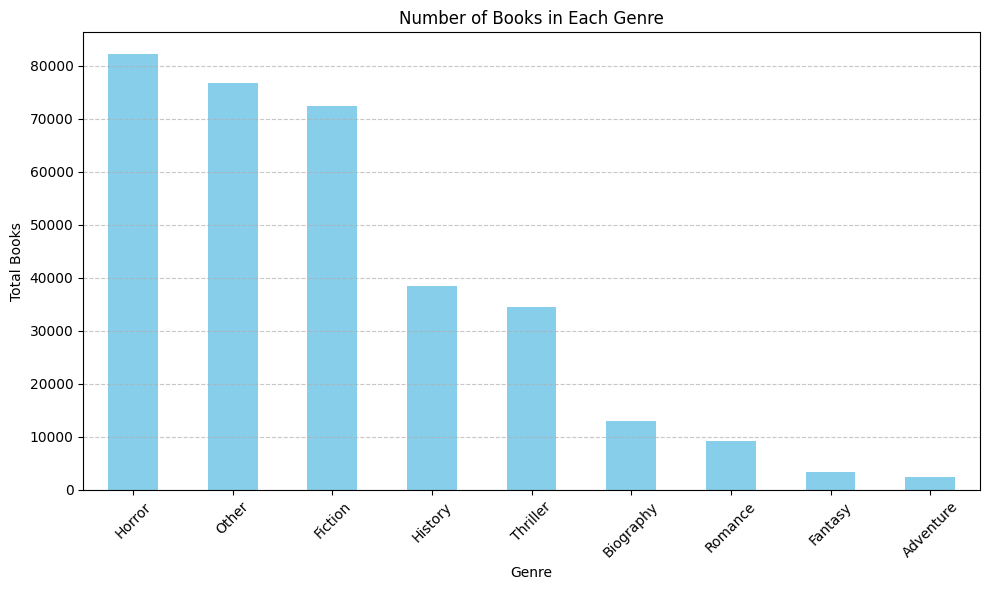

In [32]:
genre_counts = final_df['Genre'].value_counts()

# Plotting
plt.figure(figsize=(10, 6))
genre_counts.plot(kind='bar', color='skyblue')
plt.title('Number of Books in Each Genre')
plt.xlabel('Genre')
plt.ylabel('Total Books')
plt.xticks(rotation=45)
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.tight_layout()
plt.show()

## Model Predict for Text Classification

Learning Curve Function

In [33]:
def plot_learning_curve(estimator, X_train, y_train, X_test, y_test, train_sizes=np.linspace(0.1, 1.0, 10), cv=5):
    train_sizes, train_scores, test_scores = learning_curve(
        estimator, X_train, y_train, train_sizes=train_sizes, cv=cv
    )

    train_scores_mean = np.mean(train_scores, axis=1)
    test_scores_mean = np.mean(test_scores, axis=1)

    plt.figure()
    plt.plot(train_sizes, train_scores_mean, 'o-', color="r", label="Training score")
    plt.plot(train_sizes, test_scores_mean, 'o-', color="g", label="Testing score")
    plt.xlabel("Training examples")
    plt.ylabel("Score")
    plt.title("Learning Curve")
    plt.legend(loc="best")
    plt.grid()
    plt.show()

Naive Bayes

In [34]:
X = final_df['Book-Title']
y = final_df['Genre']

# Splitting the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42, stratify=y)

# TF-IDF vectorization
vectorizer = TfidfVectorizer()
X_train_tfidf = vectorizer.fit_transform(X_train)
X_test_tfidf = vectorizer.transform(X_test)

# Initialize and train Naive Bayes classifier
nb_classifier = MultinomialNB()
nb_classifier.fit(X_train_tfidf, y_train)

# Predictions
y_pred = nb_classifier.predict(X_test_tfidf)

# Calculate accuracy
print("Accuracy train:", accuracy_score(y_train, nb_classifier.predict(X_train_tfidf)))
print("Accuracy test:", accuracy_score(y_test, y_pred))

Accuracy train: 0.75931754182541
Accuracy test: 0.7184827129261535


## Hyperparameter Tuning

### Random Search

In [35]:
# Define the parameter grid for Random Search
param_grid = {
    'alpha': uniform(0.01, 10)  # Uniform distribution for alpha
}

# Initialize the Naive Bayes classifier
nb_classifier = MultinomialNB()

# Perform Random Search
random_search = RandomizedSearchCV(nb_classifier, param_distributions=param_grid, n_iter=50, cv=5, scoring='accuracy', random_state=42)
random_search.fit(X_train_tfidf, y_train)

# Get the best hyperparameters
best_alpha = random_search.best_params_['alpha']

# Initialize and train Naive Bayes classifier with the best hyperparameters
best = MultinomialNB(alpha=best_alpha)
best.fit(X_train_tfidf, y_train)

# Predictions
y_pred = best.predict(X_test_tfidf)

print("\nNaive Bayes (after tuning with Random Search):")
print("Best Alpha:", best_alpha)
print("Accuracy train:", accuracy_score(y_train, best.predict(X_train_tfidf)))
print("Accuracy test:", accuracy_score(y_test, y_pred))
print(classification_report(y_test, y_pred))


Naive Bayes (after tuning with Random Search):
Best Alpha: 0.21584494295802448
Accuracy train: 0.7991250922342524
Accuracy test: 0.7424256113721238
              precision    recall  f1-score   support

   Adventure       0.98      0.33      0.49       478
   Biography       0.84      0.68      0.75      2587
     Fantasy       0.92      0.60      0.72       688
     Fiction       0.65      0.80      0.72     14458
     History       0.83      0.63      0.72      7679
      Horror       0.68      0.84      0.75     16429
       Other       0.83      0.74      0.79     15337
     Romance       0.92      0.62      0.74      1859
    Thriller       0.86      0.60      0.71      6893

    accuracy                           0.74     66408
   macro avg       0.83      0.65      0.71     66408
weighted avg       0.76      0.74      0.74     66408



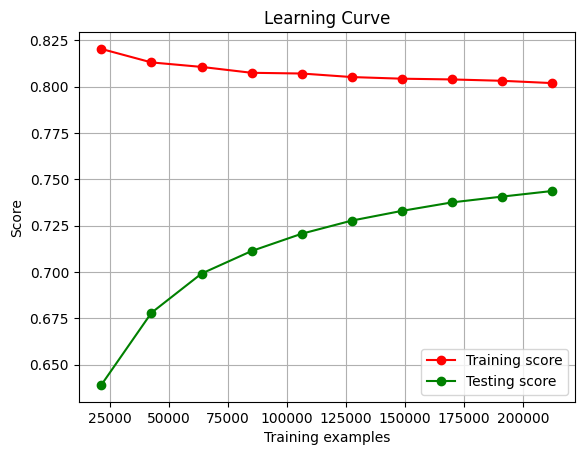

In [36]:
plot_learning_curve(best, X_train_tfidf, y_train, X_test_tfidf, y_test)

### Optuna

In [37]:
def objective(trial):
    # Define search space for alpha parameter
    alpha = trial.suggest_loguniform('alpha', 0.05, 10)
    fit_prior = trial.suggest_categorical('fit_prior', [True, False])

    # TF-IDF vectorization
    vectorizer = TfidfVectorizer()
    X_train_tfidf = vectorizer.fit_transform(X_train)
    X_test_tfidf = vectorizer.transform(X_test)

    # Initialize Naive Bayes classifier with the suggested alpha value
    nb_classifier = MultinomialNB(alpha=alpha, fit_prior=fit_prior)

    # Compute cross-validation scores
    cv_scores = cross_val_score(nb_classifier, X_train_tfidf, y_train, cv=5)

    # Return the mean cross-validation score
    return cv_scores.mean()

# Optimize hyperparameters using Optuna
study = optuna.create_study(direction='maximize')
study.optimize(objective, n_trials=30)

# Get the best hyperparameters
best_alpha = study.best_params['alpha']
best_fit_prior = study.best_params['fit_prior']

# TF-IDF vectorization using best hyperparameters
vectorizer = TfidfVectorizer()
X_train_tfidf = vectorizer.fit_transform(X_train)
X_test_tfidf = vectorizer.transform(X_test)

# Train the Naive Bayes classifier with the best hyperparameters
best_nb_classifier = MultinomialNB(alpha=best_alpha, fit_prior=best_fit_prior)
best_nb_classifier.fit(X_train_tfidf, y_train)

# Predictions
y_pred = best_nb_classifier.predict(X_test_tfidf)

# Calculate accuracy
accuracy = accuracy_score(y_test, y_pred)
print("Test Accuracy:", accuracy)

[I 2024-02-27 00:38:21,460] A new study created in memory with name: no-name-a5812fe2-beaf-4f77-b6eb-4dcc1a54d6a3
[I 2024-02-27 00:38:32,175] Trial 0 finished with value: 0.7480386171122593 and parameters: {'alpha': 0.10963245394143561, 'fit_prior': True}. Best is trial 0 with value: 0.7480386171122593.
[I 2024-02-27 00:38:42,753] Trial 1 finished with value: 0.7480461468074788 and parameters: {'alpha': 0.10859559465705274, 'fit_prior': True}. Best is trial 1 with value: 0.7480461468074788.
[I 2024-02-27 00:38:53,305] Trial 2 finished with value: 0.709687985667813 and parameters: {'alpha': 1.2565305624508998, 'fit_prior': True}. Best is trial 1 with value: 0.7480461468074788.
[I 2024-02-27 00:39:03,815] Trial 3 finished with value: 0.7358975764165546 and parameters: {'alpha': 0.7170005547673257, 'fit_prior': False}. Best is trial 1 with value: 0.7480461468074788.
[I 2024-02-27 00:39:14,358] Trial 4 finished with value: 0.7439050163983072 and parameters: {'alpha': 0.2113297605474494, 'f

Test Accuracy: 0.7502258764004337


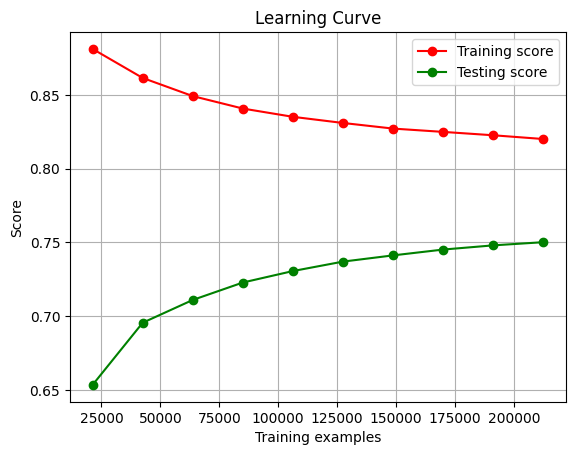

In [38]:
plot_learning_curve(best_nb_classifier, X_train_tfidf, y_train, X_test_tfidf, y_test)

The highest tuning parameter result value is **Optuna** so **Optuna** is used next.

### Test prediction with unseen data

In [39]:
# Generate random string with length 10 consisting of uppercase letters and digits for ISBN
random_string = ''.join(random.choices(string.ascii_uppercase + string.digits, k=10))

new_data = {
    'ISBN': [random_string],
    'Book-Title': ['The Ocean Island'],
    'Book-Author': ['John Cena'],
    'Publisher': ['Kartanegara'],
    'Year-Of-Publication': ['2005'],
    'Image-URL-S': ['http://images.amazon.com/images/P/0002005018.01.THUMBZZZ.jpg'],
    'Image-URL-M': ['http://images.amazon.com/images/P/1552041778.01.THUMBZZZ.jpg'],
    'User-ID': [86],
    'Book-Rating': [9],
    'Age': [19]
    # Genre not available
}

# Vectorized text
new_data_features = vectorizer.transform(new_data['Book-Title'])

predicted_genre = best_nb_classifier.predict(new_data_features)

print("Predicted Genre:", predicted_genre)

Predicted Genre: ['Horror']


In [40]:
check = final_df[final_df['Book-Title'] == 'The Ocean Island']

In [41]:
# If data is not found, add new data to final_df dataframe
if check.empty:
    new_entry = pd.DataFrame(new_data)
    new_entry['Genre'] = predicted_genre
    final_df = pd.concat([final_df, new_entry], ignore_index=True)

In [42]:
check = final_df[final_df['Book-Title'] == 'The Ocean Island']
check

,ISBN,Book-Title,Book-Author,Year-Of-Publication,Publisher,Image-URL-S,Image-URL-M,User-ID,Book-Rating,Age,Genre
332036,UJWFLPKDR6,The Ocean Island,John Cena,2005,Kartanegara,http://images.amazon.com/images/P/0002005018.01.THUMBZZZ.jpg,http://images.amazon.com/images/P/1552041778.01.THUMBZZZ.jpg,86,9,19,Horror


In [43]:
final_df.sample(5)

,ISBN,Book-Title,Book-Author,Year-Of-Publication,Publisher,Image-URL-S,Image-URL-M,User-ID,Book-Rating,Age,Genre
131102,0449224392,Traitor's Gate,Anne Perry,1996,Fawcett Books,http://images.amazon.com/images/P/0449224392.01.THUMBZZZ.jpg,http://images.amazon.com/images/P/0449224392.01.MZZZZZZZ.jpg,32036,7,35,Other
196594,0553280287,The Effect of Gamma Rays on Man-In-The-Moon Marigolds,PAUL ZINDEL,1984,Bantam,http://images.amazon.com/images/P/0553280287.01.THUMBZZZ.jpg,http://images.amazon.com/images/P/0553280287.01.MZZZZZZZ.jpg,123883,5,18,Horror
198924,0671021311,Get a Life!,William Shatner,1999,Atria,http://images.amazon.com/images/P/0671021311.01.THUMBZZZ.jpg,http://images.amazon.com/images/P/0671021311.01.MZZZZZZZ.jpg,99196,9,29,Fiction
24451,0671038184,Jewel,Bret Lott,1999,Washington Square Press,http://images.amazon.com/images/P/0671038184.01.THUMBZZZ.jpg,http://images.amazon.com/images/P/0671038184.01.MZZZZZZZ.jpg,240568,7,34,Other
296170,1930486278,Dog Walker,Heath Kizzier,2001,Salvo Press,http://images.amazon.com/images/P/1930486278.01.THUMBZZZ.jpg,http://images.amazon.com/images/P/1930486278.01.MZZZZZZZ.jpg,177809,7,34,Other


Genre Distribution

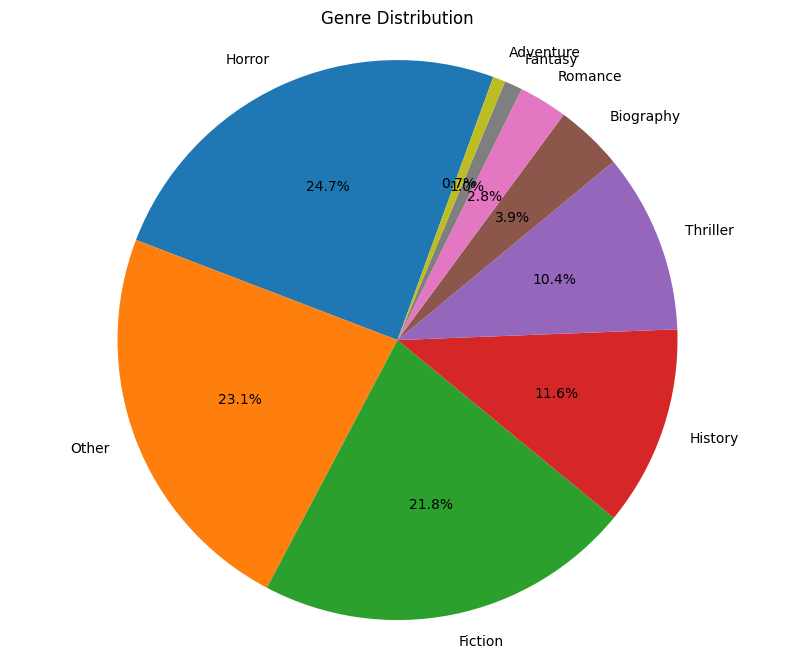

In [44]:
genre_counts = final_df['Genre'].value_counts()

# Pie chart
plt.figure(figsize=(10, 8))
plt.pie(genre_counts, labels=genre_counts.index, autopct='%1.1f%%', startangle=70)
plt.axis('equal')
plt.title('Genre Distribution')
plt.show()

In [45]:
genre_counts = final_df['Genre'].value_counts()
genre_counts

Genre
Horror       82145
Other        76682
Fiction      72287
History      38393
Thriller     34466
Biography    12937
Romance       9297
Fantasy       3438
Adventure     2392
Name: count, dtype: int64

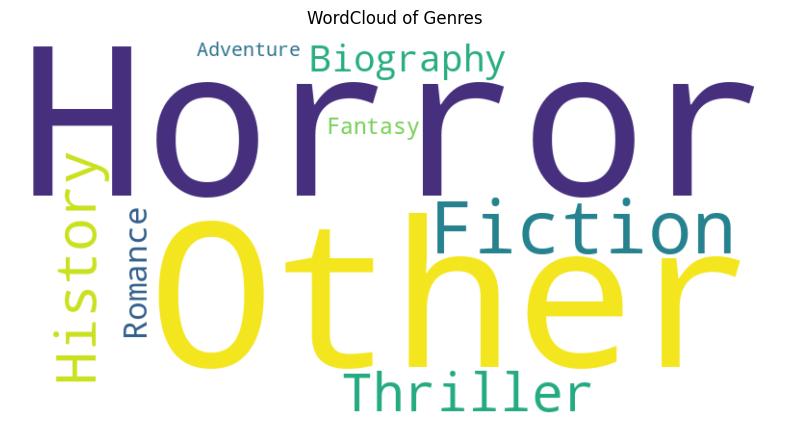

In [46]:
# WordCloud
wordcloud = WordCloud(width=800, height=400, background_color ='white', collocations=False).generate_from_frequencies(genre_counts)

# Show WordCloud
plt.figure(figsize=(10, 5))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis('off')
plt.title('WordCloud of Genres')
plt.show()

## Recommendations

In [47]:
corpus = (final_df['Book-Title'] + ' ' + final_df['Genre']).apply(str.split).tolist()

In [48]:
word2vec_model_recommender = Word2Vec(sentences=corpus, vector_size=500, window=5, min_count=5, sg=2)

In [49]:
def get_recommendations(title, genre, data, word2vec_model):
    # Combine title and genre into one text
    text = title + ' ' + genre

    # Tokenize text
    tokens = text.split()

    # Get average vector for tokens
    vectors = [word2vec_model.wv[token] for token in tokens if token in word2vec_model.wv]
    if len(vectors) == 0:
        return None

    avg_vector = sum(vectors) / len(vectors)

    # Calculate cosine similarity with all other books
    similarities = []
    recommended_titles = set()  # Set to store titles of recommended books
    for idx, row in data.iterrows():
        other_vectors = [word2vec_model.wv[token] for token in row['Book-Title'].split() if token in word2vec_model.wv]
        if len(other_vectors) > 0:
            other_avg_vector = sum(other_vectors) / len(other_vectors)
            similarity = cosine_similarity([avg_vector], [other_avg_vector])[0][0]
            similarities.append((row, similarity))

    # Sort by similarity
    similarities.sort(key=lambda x: x[1], reverse=True)

    # Get top 10 unique recommendations
    recommendations = []
    for book, sim in similarities:
        if book['Book-Title'] not in recommended_titles and book['Book-Rating'] > 5:
            recommendations.append(book.to_dict())
            recommended_titles.add(book['Book-Title'])
        if len(recommendations) >= 10:
            break

    df_recommendations = pd.DataFrame(recommendations)

    return df_recommendations

In [50]:
recommendations = get_recommendations("Anglo-American Cataloguing Rules", "Fiction", final_df.sample(10000), word2vec_model_recommender)
recommendations

,ISBN,Book-Title,Book-Author,Year-Of-Publication,Publisher,Image-URL-S,Image-URL-M,User-ID,Book-Rating,Age,Genre
0,0747241392,Skinner's Rules,Quintin Jardine,2001,Headline,http://images.amazon.com/images/P/0747241392.01.THUMBZZZ.jpg,http://images.amazon.com/images/P/0747241392.01.MZZZZZZZ.jpg,119199,9,45,Other
1,0440212219,Making Shapely Fiction,Jerome Stern,1997,Dell Publishing Company,http://images.amazon.com/images/P/0440212219.01.THUMBZZZ.jpg,http://images.amazon.com/images/P/0440212219.01.MZZZZZZZ.jpg,129716,8,30,Fiction
2,1883523192,Roberts' Rules of Lesbian Break-ups,Shelly Roberts,1997,Spinsters Ink Books,http://images.amazon.com/images/P/1883523192.01.THUMBZZZ.jpg,http://images.amazon.com/images/P/1883523192.01.MZZZZZZZ.jpg,138578,10,38,Fiction
3,0425121631,Rules of Prey,John Sandford,1992,Berkley Publishing Group,http://images.amazon.com/images/P/0425121631.01.THUMBZZZ.jpg,http://images.amazon.com/images/P/0425121631.01.MZZZZZZZ.jpg,234675,8,35,Fiction
4,0345387651,The Cider House Rules,John Irving,1994,Ballantine Books,http://images.amazon.com/images/P/0345387651.01.THUMBZZZ.jpg,http://images.amazon.com/images/P/0345387651.01.MZZZZZZZ.jpg,255786,10,36,Horror
5,0898793491,Dialogue: A Socratic Dialogue on the Art of Writing Dialogue in Fiction (Elements of Fiction Writing),Lewis Turco,1989,Writer's Digest Books,http://images.amazon.com/images/P/0898793491.01.THUMBZZZ.jpg,http://images.amazon.com/images/P/0898793491.01.MZZZZZZZ.jpg,29855,7,53,Fiction
6,0380000547,"The Science Fiction Hall of Fame, Volume IIB",Ben Bova,1983,Harper Mass Market Paperbacks (Mm),http://images.amazon.com/images/P/0380000547.01.THUMBZZZ.jpg,http://images.amazon.com/images/P/0380000547.01.MZZZZZZZ.jpg,184299,9,31,Fiction
7,1562477544,A Song for Jeffrey (Ag Fiction (American Girl)),Constance M. Foland,1999,Pleasant Company Publications,http://images.amazon.com/images/P/1562477544.01.THUMBZZZ.jpg,http://images.amazon.com/images/P/1562477544.01.MZZZZZZZ.jpg,278633,7,35,Fiction
8,0445405457,Rough Cider,Peter Lovesey,1988,Warner Books,http://images.amazon.com/images/P/0445405457.01.THUMBZZZ.jpg,http://images.amazon.com/images/P/0445405457.01.MZZZZZZZ.jpg,11676,7,35,Other
9,0375703438,Rules of the Wild,Francesca Marciano,1999,Vintage Books USA,http://images.amazon.com/images/P/0375703438.01.THUMBZZZ.jpg,http://images.amazon.com/images/P/0375703438.01.MZZZZZZZ.jpg,11676,7,35,Horror
